In [11]:
#Imports
import csv
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, LineString
import matplotlib.pyplot as plt
import regex as re
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from datetime import datetime
from datetime import timedelta
import numpy as np

from pyproj import Transformer

In [12]:
df = gpd.read_file("RoadTrafficAccidentLocations.csv")

In [13]:
df.head()

,AccidentUID,AccidentType,AccidentType_de,AccidentType_fr,AccidentType_it,AccidentType_en,AccidentSeverityCategory,AccidentSeverityCategory_de,AccidentSeverityCategory_fr,AccidentSeverityCategory_it,...,AccidentMonth_it,AccidentMonth_en,AccidentWeekDay,AccidentWeekDay_de,AccidentWeekDay_fr,AccidentWeekDay_it,AccidentWeekDay_en,AccidentHour,AccidentHour_text,geometry
0,9FD6441F802C20A6E0430A865E3320A6,at0,Schleuder- oder Selbstunfall,dérapage ou perte de maîtrise,Incidente di sbandamento o per colpa propria,Accident with skidding or self-accident,as3,Unfall mit Leichtverletzten,accident avec blessés légers,Incidente con feriti leggeri,...,Gennaio,January,aw406,Samstag,samedi,Sabato,Saturday,01,01h-02h,None
1,99AE7B25356510B0E0430A865E3310B0,at4,Einbiegeunfall,accident en s'engageant sur une route,Incidente nell’immettersi in una strada,Accident when turning-into main road,as3,Unfall mit Leichtverletzten,accident avec blessés légers,Incidente con feriti leggeri,...,Gennaio,January,aw406,Samstag,samedi,Sabato,Saturday,01,01h-02h,None
2,9A096471BA579094E0430A865E339094,at00,Andere,autres,Altri,Other,as2,Unfall mit Schwerverletzten,accident avec blessés graves,Incidente con feriti gravi,...,Gennaio,January,aw406,Samstag,samedi,Sabato,Saturday,02,02h-03h,None
3,9B1F49744917E014E0430A865E33E014,at3,Abbiegeunfall,accident en quittant une route,Incidente nello svoltare,Accident when turning left or right,as3,Unfall mit Leichtverletzten,accident avec blessés légers,Incidente con feriti leggeri,...,Gennaio,January,aw406,Samstag,samedi,Sabato,Saturday,02,02h-03h,None
4,99B6C7F3285BB044E0430A865E33B044,at0,Schleuder- oder Selbstunfall,dérapage ou perte de maîtrise,Incidente di sbandamento o per colpa propria,Accident with skidding or self-accident,as2,Unfall mit Schwerverletzten,accident avec blessés graves,Incidente con feriti gravi,...,Gennaio,January,aw406,Samstag,samedi,Sabato,Saturday,02,02h-03h,None


In [14]:
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 178217 entries, 0 to 178216
Data columns (total 37 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   AccidentUID                  178217 non-null  object  
 1   AccidentType                 178217 non-null  object  
 2   AccidentType_de              178217 non-null  object  
 3   AccidentType_fr              178217 non-null  object  
 4   AccidentType_it              178217 non-null  object  
 5   AccidentType_en              178217 non-null  object  
 6   AccidentSeverityCategory     178217 non-null  object  
 7   AccidentSeverityCategory_de  178217 non-null  object  
 8   AccidentSeverityCategory_fr  178217 non-null  object  
 9   AccidentSeverityCategory_it  178217 non-null  object  
 10  AccidentSeverityCategory_en  178217 non-null  object  
 11  AccidentInvolvingPedestrian  178217 non-null  object  
 12  AccidentInvolvingBicycle     178217 

In [15]:
#Dataset looks very clean, I just dont need all those columns. 
df.drop(['AccidentUID','AccidentType_de','AccidentType_fr', 'AccidentType_it', 'AccidentType_en', 'AccidentSeverityCategory_de', 'AccidentSeverityCategory_fr', 'AccidentSeverityCategory_it', 'AccidentSeverityCategory_en', 'RoadType_de', 'RoadType_fr', 'RoadType_en', 'RoadType_it', 
'AccidentMonth_de', 'AccidentMonth_fr', 'AccidentMonth_en', 'AccidentMonth_it', 'AccidentWeekDay_de', 'AccidentWeekDay_fr', 'AccidentWeekDay_en', 'AccidentWeekDay_it', 'AccidentHour_text', 'geometry'
],axis=1 ,inplace=True)
df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 178217 entries, 0 to 178216
Data columns (total 14 columns):
 #   Column                       Non-Null Count   Dtype 
---  ------                       --------------   ----- 
 0   AccidentType                 178217 non-null  object
 1   AccidentSeverityCategory     178217 non-null  object
 2   AccidentInvolvingPedestrian  178217 non-null  object
 3   AccidentInvolvingBicycle     178217 non-null  object
 4   AccidentInvolvingMotorcycle  178217 non-null  object
 5   RoadType                     178217 non-null  object
 6   AccidentLocation_CHLV95_E    178217 non-null  object
 7   AccidentLocation_CHLV95_N    178217 non-null  object
 8   CantonCode                   178217 non-null  object
 9   MunicipalityCode             178217 non-null  object
 10  AccidentYear                 178217 non-null  object
 11  AccidentMonth                178217 non-null  object
 12  AccidentWeekDay              178217 non-null  object
 13  Accide

In [16]:
#Yep, looks good to go. 
df.describe()

,AccidentType,AccidentSeverityCategory,AccidentInvolvingPedestrian,AccidentInvolvingBicycle,AccidentInvolvingMotorcycle,RoadType,AccidentLocation_CHLV95_E,AccidentLocation_CHLV95_N,CantonCode,MunicipalityCode,AccidentYear,AccidentMonth,AccidentWeekDay,AccidentHour
count,178217,178217,178217,178217,178217,178217,178217,178217,178217,178217,178217,178217,178217,178217
unique,11,3,2,2,2,6,113640,97461,26,2138,10,12,7,25
top,at0,as3,false,false,false,rt432,2678732,1253079,ZH,0261,2011,6,aw405,17
freq,55801,138868,157080,137214,141038,89517,30,29,32178,12131,18990,18903,28986,19264


# Exploratory data analysis

In [17]:
#Number of accidents in Switzerland between 2011 and 2020. Should be 178'217 since each entry of the data frame represent a different car accident.
print('Total number of accidents between 2011 and 2020 in Switzerland :{}'.format(df.shape[0]))

Total number of accidents between 2011 and 2020 in Switzerland :178217


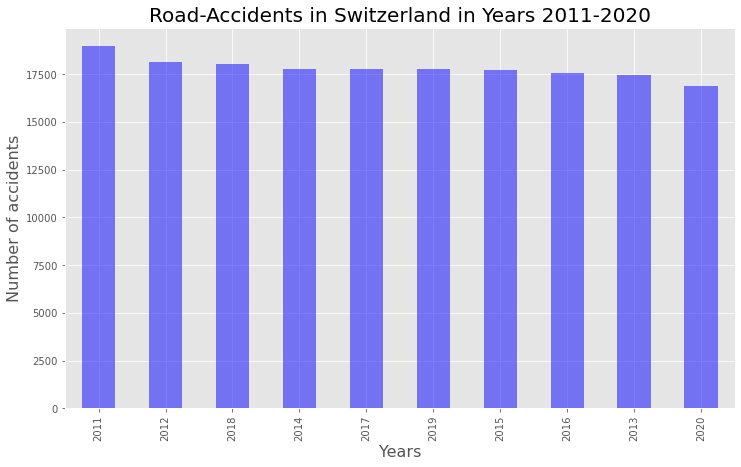

In [18]:
#Number of accidents on swiss roads seems stable, although it decreased in 2020 – probably due to Corona (more home office, less tourists driving through,...)
no_of_accident = df['AccidentYear'].value_counts()

plt.style.use('ggplot')

# plot accidents per month
no_of_accident.plot(kind='bar',figsize=(12,7), color='blue', alpha=0.5)

# title and x,y labels
plt.title('Road-Accidents in Switzerland in Years 2011-2020', fontsize=20)
plt.xlabel('Years',fontsize=16)
plt.ylabel('Number of accidents',fontsize=16);

In [19]:
#Finding out how serious the accidents were and plotting them directly. 
#as1 Unfall mit Getöteten
#as2 Unfall mit Schwerverletzten
#as3 Unfall mit Leichtverletzten
df['AccidentSeverityCategory'].value_counts()

as3    138868
as2     36954
as1      2395
Name: AccidentSeverityCategory, dtype: int64

Text(0, 0.5, '')

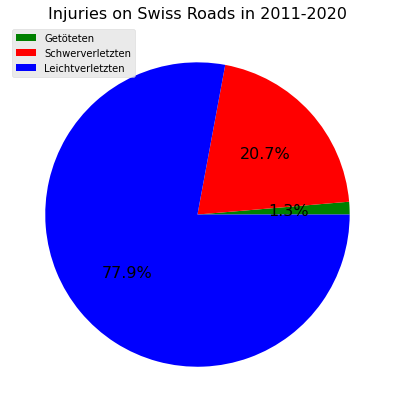

In [20]:
#Plottiny the accidents. Every fifth accident was severe or deadly. That's more than I expected.

# Serie with number of Getöteten, Schwerverletzten and Leichtverletzten
injuries = df.groupby('AccidentSeverityCategory').size()

# Pie plot with the percentage of victims with mild and serious injuries
injuries.plot(kind='pie',figsize=(7,7), colors=['green','red','blue'], labels=None, autopct='%1.1f%%', fontsize=16)

# Legend and title
plt.legend(labels=['Getöteten', 'Schwerverletzten','Leichtverletzten'])
plt.title('Injuries on Swiss Roads in 2011-2020', fontsize=16)
plt.ylabel('')

# How did the number of Fussgängerunfälle (AccidentType == at8) change over the years and how severe where they? 

In [23]:
#I'm also looking at Fussgängerunfälle specifically since that's an area where maybe improvment can be done rather easily. 
#There were around 20'580 Fussgängerunfälle. Of those, over 25% were severe or deadly. That's worse than accidents that don't involve pedestrians.  
df[df['AccidentType'] == 'at8']['AccidentSeverityCategory'].value_counts()   

as3    14358
as2     5716
as1      506
Name: AccidentSeverityCategory, dtype: int64

Text(0, 0.5, 'Accident')

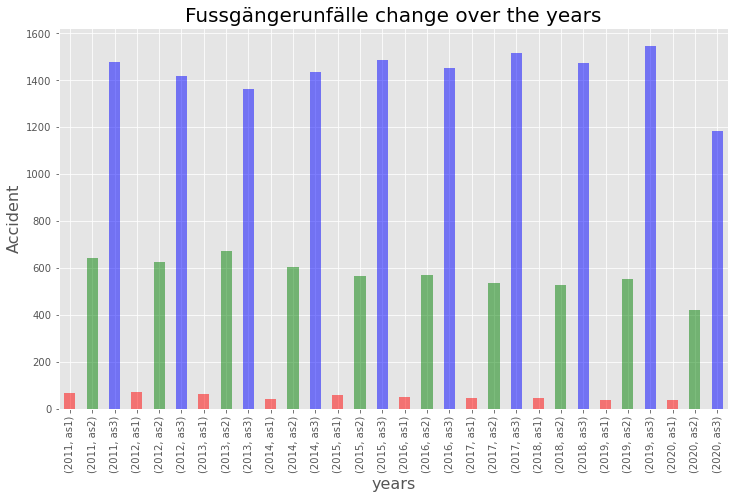

In [24]:
#The amount of Fussgängerunfälle also went back in 2020, probably due to lockdown and less cars on the street. 
Acc_type= df.loc[df['AccidentType'] =='at8'].groupby(['AccidentYear','AccidentSeverityCategory']).size()
Acc_type
Acc_type.plot(kind='bar',figsize=(12,7),color=['red','green','blue'],alpha=0.5)
plt.title('Fussgängerunfälle change over the years',fontsize=20)
plt.xlabel('years',fontsize=16)
plt.ylabel('Accident',fontsize=16)

# Transforming EPSG:2056 to EPSG:4326

In [25]:
#In order to look at the data more precise I need to visualize them on a map. First I need to transform the Longitude-Latidude-Data from EPSG:2056 to EPSG:4326
transformer = Transformer.from_crs("epsg:2056", "epsg:4326")
lat_log = []

for i in range(len(df)): 
    r = transformer.transform(df['AccidentLocation_CHLV95_E'][i], df['AccidentLocation_CHLV95_N'][i])
    
    lat_log.append(r)
lat_log    

[(47.368511515991194, 8.52932023580764),
 (46.20047469992902, 6.154034446986603),
 (47.142560187981765, 7.241844088069813),
 (47.54182048785474, 7.602153351233707),
 (45.934254393210885, 8.898091115125267),
 (47.369755536152475, 8.51368202985955),
 (45.995730397136185, 8.917417328648844),
 (46.09702523910695, 7.22541131138367),
 (46.24936113881128, 9.011358650794849),
 (46.68859376359453, 6.643035613881113),
 (45.863272446345455, 8.981257447667367),
 (46.435246474918806, 6.918492418179136),
 (46.66711049741556, 9.569946740432263),
 (46.83400400884985, 9.34248185484757),
 (47.363402566223385, 8.42315853637464),
 (47.366542321434984, 8.540613265621232),
 (46.61215561275356, 7.674179948255796),
 (47.0687670646651, 8.282047748135632),
 (46.49314969300358, 6.891155097440284),
 (47.07912191087653, 8.290440814219671),
 (46.102210394410704, 7.073184305689691),
 (47.21082129742639, 7.737634528703208),
 (47.40467598609382, 8.55711586690878),
 (47.39543114213954, 8.6402334056748),
 (47.5421457145

In [26]:
#Here im adding latitude & Longtitude columns to the previous dataset
df1 = pd.DataFrame(lat_log, columns =['latitude', 'longitude'])
df1
df = pd.concat([df, df1], axis=1)
df

,AccidentType,AccidentSeverityCategory,AccidentInvolvingPedestrian,AccidentInvolvingBicycle,AccidentInvolvingMotorcycle,RoadType,AccidentLocation_CHLV95_E,AccidentLocation_CHLV95_N,CantonCode,MunicipalityCode,AccidentYear,AccidentMonth,AccidentWeekDay,AccidentHour,latitude,longitude
0,at0,as3,false,true,false,rt433,2682382,1246980,ZH,0261,2011,1,aw406,01,47.368512,8.529320
1,at4,as3,false,false,true,rt433,2500845,1117371,GE,6621,2011,1,aw406,01,46.200475,6.154034
2,at00,as2,false,true,false,rt433,2585073,1221306,BE,0371,2011,1,aw406,02,47.142560,7.241844
3,at3,as3,false,false,false,rt433,2612312,1265690,BS,2701,2011,1,aw406,02,47.541820,7.602153
4,at0,as2,false,false,false,rt433,2713199,1088015,TI,5203,2011,1,aw406,02,45.934254,8.898091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178212,at0,as3,false,true,false,rt433,2647354,1249797,AG,4001,2020,12,aw404,18,47.397295,8.065893
178213,at2,as3,false,false,false,rt430,2622630,1237718,SO,2407,2020,12,aw404,19,47.289965,7.737786
178214,at0,as3,false,false,false,rt432,2565044,1221325,BE,0445,2020,12,aw404,19,47.141973,6.977802
178215,at8,as1,true,false,false,rt433,2616934,1218427,BE,0424,2020,12,aw404,22,47.116619,7.661765


In [27]:
df['Punkt'] = df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)

/Users/vob/opt/anaconda3/envs/pyproj_env/lib/python3.10/site-packages/pandas/core/dtypes/cast.py:118: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  arr = construct_1d_object_array_from_listlike(values)


# Merging Data with Pure_str.csv file

In [28]:
#Base column to be merged with new data
df['AccidentLocation_CHLV95_N']

0         1246980
1         1117371
2         1221306
3         1265690
4         1088015
           ...   
178212    1249797
178213    1237718
178214    1221325
178215    1218427
178216    1268291
Name: AccidentLocation_CHLV95_N, Length: 178217, dtype: object

In [29]:
#new data
df2= pd.read_csv("pure_str.csv", sep=";")
df2.head()

,STR_ESID,STN_LABEL,ZIP_LABEL,COM_FOSNR,COM_NAME,COM_CANTON,STR_TYPE,STR_STATUS,STR_OFFICIAL,STR_VALID,STR_MODIFIED,STR_EASTING,STR_NORTHING
0,10062747,Alpinaweg,8784 Braunwald,1631,Glarus Süd,GL,Street,real,True,True,07.04.2021,2718803.0,1199848.0
1,10089170,Nordstrasse,8750 Glarus,1632,Glarus,GL,Street,real,True,True,07.04.2021,2723368.0,1212051.0
2,10238446,Panoramaweg,8874 Mühlehorn,1630,Glarus Nord,GL,Street,real,True,True,07.04.2021,2732027.0,1219801.0
3,10204832,Oberblegi,8775 Luchsingen,1631,Glarus Süd,GL,Area,real,True,True,07.04.2021,2720309.0,1204175.0
4,10021222,Bruggli,8754 Netstal,1632,Glarus,GL,Street,real,True,True,07.04.2021,2722654.0,1213161.0


In [30]:
df2.columns

Index(['STR_ESID', 'STN_LABEL', 'ZIP_LABEL', 'COM_FOSNR', 'COM_NAME',
       'COM_CANTON', 'STR_TYPE', 'STR_STATUS', 'STR_OFFICIAL', 'STR_VALID',
       'STR_MODIFIED', 'STR_EASTING', 'STR_NORTHING'],
      dtype='object')

In [31]:
#extracting columns we need from new data and store in df_temp
df_temp=df2[['STN_LABEL','STR_NORTHING','COM_NAME','STR_EASTING','STR_ESID']]

In [32]:
#converting AccidentLocation_CHLV95_N to float. Previously it was object type
df['AccidentLocation_CHLV95_N']=df['AccidentLocation_CHLV95_N'].astype(float)
df['AccidentLocation_CHLV95_E']=df['AccidentLocation_CHLV95_E'].astype(float)

In [33]:
#Now we can merge
#df_merged=pd.merge(df, df_temp, left_on=["AccidentLocation_CHLV95_N","AccidentLocation_CHLV95_E"],right_on=["STR_NORTHING","STR_EASTING"])
df_merged=pd.merge(df, df_temp, left_on=["AccidentLocation_CHLV95_N"],right_on=["STR_NORTHING"],how='left')
df_merged[['AccidentLocation_CHLV95_N','AccidentLocation_CHLV95_E','STR_NORTHING','STR_EASTING','STN_LABEL','COM_NAME','latitude','longitude','Punkt']]

,AccidentLocation_CHLV95_N,AccidentLocation_CHLV95_E,STR_NORTHING,STR_EASTING,STN_LABEL,COM_NAME,latitude,longitude,Punkt
0,1246980.0,2682382.0,1246980.0,2681697.0,Gotthelfstrasse,Zürich,47.368512,8.529320,POINT (8.52932023580764 47.368511515991194)
1,1117371.0,2500845.0,1117371.0,2501216.0,Carrefour de Villereuse,Genève,46.200475,6.154034,POINT (6.154034446986603 46.20047469992902)
2,1221306.0,2585073.0,1221306.0,2671643.0,Iberg,Inwil,47.142560,7.241844,POINT (7.241844088069813 47.142560187981765)
3,1265690.0,2612312.0,1265690.0,2605219.0,Libsbachmühleweg,Schönenbuch,47.541820,7.602153,POINT (7.602153351233707 47.54182048785474)
4,1088015.0,2713199.0,1088015.0,2720358.0,Strecia dal Riaa,Rovio,45.934254,8.898091,POINT (8.898091115125267 45.934254393210885)
...,...,...,...,...,...,...,...,...,...
329354,1237718.0,2622630.0,NaN,NaN,NaN,NaN,47.289965,7.737786,POINT (7.737785887822907 47.28996476392248)
329355,1221325.0,2565044.0,NaN,NaN,NaN,NaN,47.141973,6.977802,POINT (6.977801619502515 47.141973344081926)
329356,1218427.0,2616934.0,NaN,NaN,NaN,NaN,47.116619,7.661765,POINT (7.661764848135851 47.11661926939236)
329357,1268291.0,2738486.0,1268291.0,2711972.0,Kuhtobel,Frauenfeld,47.550728,9.278507,POINT (9.27850749620211 47.55072766884272)


In [34]:
df_merged.columns

Index(['AccidentType', 'AccidentSeverityCategory',
       'AccidentInvolvingPedestrian', 'AccidentInvolvingBicycle',
       'AccidentInvolvingMotorcycle', 'RoadType', 'AccidentLocation_CHLV95_E',
       'AccidentLocation_CHLV95_N', 'CantonCode', 'MunicipalityCode',
       'AccidentYear', 'AccidentMonth', 'AccidentWeekDay', 'AccidentHour',
       'latitude', 'longitude', 'Punkt', 'STN_LABEL', 'STR_NORTHING',
       'COM_NAME', 'STR_EASTING', 'STR_ESID'],
      dtype='object')

In [35]:
df_merged = df_merged[df_merged['STR_NORTHING'].notna()]
df_merged

,AccidentType,AccidentSeverityCategory,AccidentInvolvingPedestrian,AccidentInvolvingBicycle,AccidentInvolvingMotorcycle,RoadType,AccidentLocation_CHLV95_E,AccidentLocation_CHLV95_N,CantonCode,MunicipalityCode,...,AccidentWeekDay,AccidentHour,latitude,longitude,Punkt,STN_LABEL,STR_NORTHING,COM_NAME,STR_EASTING,STR_ESID
0,at0,as3,false,true,false,rt433,2682382.0,1246980.0,ZH,0261,...,aw406,01,47.368512,8.529320,POINT (8.52932023580764 47.368511515991194),Gotthelfstrasse,1246980.0,Zürich,2681697.0,10098543.0
1,at4,as3,false,false,true,rt433,2500845.0,1117371.0,GE,6621,...,aw406,01,46.200475,6.154034,POINT (6.154034446986603 46.20047469992902),Carrefour de Villereuse,1117371.0,Genève,2501216.0,10113949.0
2,at00,as2,false,true,false,rt433,2585073.0,1221306.0,BE,0371,...,aw406,02,47.142560,7.241844,POINT (7.241844088069813 47.142560187981765),Iberg,1221306.0,Inwil,2671643.0,10185154.0
3,at3,as3,false,false,false,rt433,2612312.0,1265690.0,BS,2701,...,aw406,02,47.541820,7.602153,POINT (7.602153351233707 47.54182048785474),Libsbachmühleweg,1265690.0,Schönenbuch,2605219.0,10056299.0
4,at0,as2,false,false,false,rt433,2713199.0,1088015.0,TI,5203,...,aw406,02,45.934254,8.898091,POINT (8.898091115125267 45.934254393210885),Strecia dal Riaa,1088015.0,Rovio,2720358.0,10174208.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
329351,at0,as3,false,true,false,rt433,2647354.0,1249797.0,AG,4001,...,aw404,18,47.397295,8.065893,POINT (8.065892545863187 47.39729465350737),Kirschbaumstrasse,1249797.0,Bergdietikon,2671219.0,10094309.0
329352,at0,as3,false,true,false,rt433,2647354.0,1249797.0,AG,4001,...,aw404,18,47.397295,8.065893,POINT (8.065892545863187 47.39729465350737),Hönggerrampe,1249797.0,Zürich,2679623.0,10249375.0
329353,at0,as3,false,true,false,rt433,2647354.0,1249797.0,AG,4001,...,aw404,18,47.397295,8.065893,POINT (8.065892545863187 47.39729465350737),Toracker Park,1249797.0,Herisau,2739132.0,10169100.0
329357,at0,as2,false,false,false,rt433,2738486.0,1268291.0,TG,4461,...,aw404,23,47.550728,9.278507,POINT (9.27850749620211 47.55072766884272),Kuhtobel,1268291.0,Frauenfeld,2711972.0,10244136.0


# PROBLEM: LONG/LAT DON'T MATCH ADRESSES

#First Result (0) should show Gotthelfstrasse in Zurich (see cell above). But if I control it with https://www.gpskoordinaten.de/ (or similar tools) it shows Tunnelstrasse for the coordinates 47.368512/8.529320 which is a few meters next to it (see image below). Happens with almost all results, they are a few meters or kilometers away.

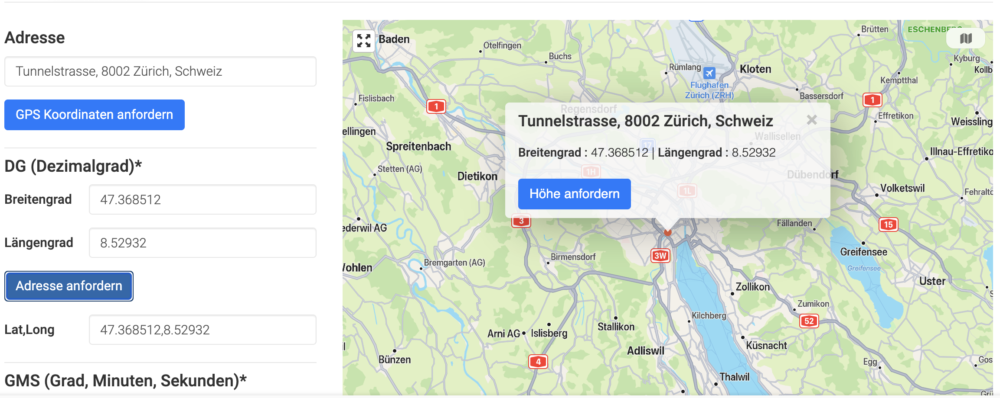# 

#Only 39 results are same on East and North-Coordinates but even that doesn't necessarily mean the accident-spot is correct. 
#Therefore I rather continue using the whole file just to have more datapoints instead of merging by East and North coordinates. 
#Code for merging both would be: 
#df_merged=pd.merge(df, df_temp, left_on=["AccidentLocation_CHLV95_N","AccidentLocation_CHLV95_E"],right_on=["STR_NORTHING","STR_EASTING"])
#df_merged[['AccidentLocation_CHLV95_N','AccidentLocation_CHLV95_E','STR_NORTHING','STR_EASTING','STN_LABEL','COM_NAME']]

# What streets are the most dangerous?

In [38]:
#eventhough the spots aren't correct, I can still try to find the most dangerous street. I wanna show the streets where most deadly accidents (as1) happened between 2011 and 2020. 
#Results are disappointing from journalistic standpoint, nothing standing out.
d_grouped=df_merged.loc[df_merged['AccidentSeverityCategory']=='as1'].groupby(['STN_LABEL', 'AccidentSeverityCategory','COM_NAME']).size().sort_values(ascending=False)
d_grouped.head(10)

STN_LABEL               AccidentSeverityCategory  COM_NAME              
Müselbachstrasse        as1                       Mosnang                   2
Schalchenstrasse        as1                       Pfäffikon                 2
Unterholzstrasse        as1                       Meikirch                  2
Chemin de Neyruz        as1                       Riaz                      2
Geissberg               as1                       Bütschwil-Ganterschwil    2
Blumenweg               as1                       Lengnau (AG)              2
Route de Formangueires  as1                       Belfaux                   2
Oberhüsli               as1                       Hergiswil bei Willisau    2
Kammenhütte             as1                       Sumiswald                 2
Lindenweg               as1                       Au (SG)                   2
dtype: int64

Text(0, 0.5, '# of Accidents')

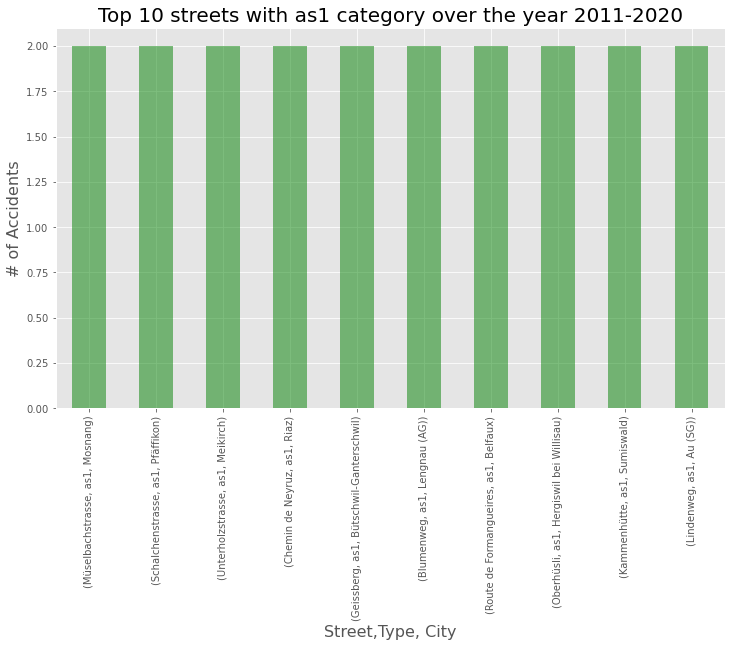

In [39]:
#plotting the streets
d_grouped.head(10).plot(kind='bar',figsize=(12,7),color=['green'],alpha=0.5)
plt.title('Top 10 streets with as1 category over the year 2011-2020',fontsize=20)
plt.xlabel('Street,Type, City',fontsize=16)
plt.ylabel('# of Accidents',fontsize=16)

# Displaying results on map

In [40]:
#Eventhough it doesn't work and therefore I can't to the analysis I want #Analyzing the street names didn't do anything for me. But I can still show the deadly accidents on a map. Clustering them in a way that has more value than the analysis above. 

In [41]:
#Here I first I grouped the merged dataframe. 
#Then renamed the column 0 to #of accidents.
#Then again I had to merge this newly(df_merged_map) created dataframe with the large df_merged dataframe. 
#And filtered out all the information needed for the rows of d_grouped_map.
d_grouped_map=df_merged.loc[df_merged['AccidentSeverityCategory']=='as1'].groupby(['STN_LABEL', 'AccidentSeverityCategory','COM_NAME']).size().sort_values(ascending=False)
d_grouped_map=pd.DataFrame(d_grouped_map)
d_grouped_map=d_grouped_map.rename(columns={0:"# of accidents"})
d_grouped_map=d_grouped_map.reset_index()
d_grouped_map=pd.merge(d_grouped_map, df_merged, left_on=["AccidentSeverityCategory","STN_LABEL","COM_NAME"],right_on=["AccidentSeverityCategory","STN_LABEL","COM_NAME"],how='left')
d_grouped_map = d_grouped_map[d_grouped_map['# of accidents'].notna()]
d_grouped_map=d_grouped_map.sort_values(by='# of accidents',ascending=False)
d_grouped_map=d_grouped_map.drop_duplicates(subset=['STN_LABEL', 'AccidentSeverityCategory','COM_NAME'], keep='first')
d_grouped_map=d_grouped_map.reset_index()
d_grouped_map

,index,STN_LABEL,AccidentSeverityCategory,COM_NAME,# of accidents,AccidentType,AccidentInvolvingPedestrian,AccidentInvolvingBicycle,AccidentInvolvingMotorcycle,RoadType,...,AccidentYear,AccidentMonth,AccidentWeekDay,AccidentHour,latitude,longitude,Punkt,STR_NORTHING,STR_EASTING,STR_ESID
0,0,Müselbachstrasse,as1,Mosnang,2,at4,false,true,false,rt433,...,2018,10,aw401,09,47.386531,8.075196,POINT (8.075195645194084 47.38653135884963),1248606.0,2719424.0,10092726.0
1,64,Haldenstrasse,as1,Thürnen,2,at6,false,false,false,rt432,...,2011,4,aw403,05,47.455724,7.747110,POINT (7.747109550171689 47.45572376328192),1256150.0,2629353.0,10190885.0
2,74,Stegbachstrasse,as1,Obergösgen,2,at0,false,true,false,rt433,...,2020,4,aw403,19,47.363742,8.575269,POINT (8.575268601857397 47.36374176000458),1246499.0,2639388.0,10023652.0
3,73,Bodenackerstrasse,as1,Breitenbach,2,at4,false,false,true,rt433,...,2020,8,aw404,06,47.403329,7.806753,POINT (7.806753336145236 47.40332935118768),1250344.0,2607990.0,10124519.0
4,71,Unterer Mettenbühlweg,as1,Breitenbach,2,at8,true,false,false,rt439,...,2016,6,aw404,13,47.407140,7.543567,POINT (7.543566988628456 47.40714012110103),1250708.0,2608573.0,10089860.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3513,1258,Zenzachweg,as1,Wintersingen,1,at3,false,true,false,rt432,...,2012,9,aw402,13,47.487267,8.758716,POINT (8.758715830213838 47.48726693080247),1260448.0,2629393.0,10096326.0
3514,1259,Ziefenstrasse,as1,Reigoldswil,1,at8,true,false,false,rt433,...,2014,10,aw405,14,47.403867,8.402244,POINT (8.402244378261422 47.40386714329048),1250785.0,2619112.0,10161935.0
3515,1260,Ziefenstrasse,as1,Seewen,1,at0,false,false,false,rt432,...,2016,5,aw401,20,47.417583,7.810416,POINT (7.810416311841448 47.41758254396596),1251930.0,2617356.0,10213193.0
3516,1261,Ziegelackerstrasse,as1,Bern,1,at6,false,false,false,rt432,...,2013,1,aw403,23,46.947488,8.011111,POINT (8.01111077631832 46.94748841065302),1199759.0,2597207.0,10083220.0


# Plottly Scatter Geo Approach

In [42]:
#Tried with Plotly scatter geo approach. I could plot the points (deadly accidents) successfully and show them on a european Map. But Swtizerland could not be marked and the streets also could not be marked. And it looks ugly. 
import plotly.express as px
import geopandas as gpd
import plotly.graph_objects as go
geo_df = gpd.GeoDataFrame(df_merged, geometry='Punkt')
geo_df_temp=geo_df.loc[(geo_df['AccidentSeverityCategory']=='as1')]
#geo_df_temp.plot()
fig = px.scatter_geo(geo_df_temp,
                    lat=geo_df_temp.latitude,
                    lon=geo_df_temp.longitude,
                    hover_name="STN_LABEL",
                    #  locationmode = ''
)
fig.update_geos(
    scope='europe',
    showcountries=True
)
# fig.update_geos()
# fig.update_layout(
#         geo_scope='europe',
#     )
fig.show()

# Folium – best approach

In [43]:
#Found the library folium which allows to visualize Data it in a Leaflet map.
import folium

# Define a map centered around Switzerland
Switzerland_map = folium.Map(location=[46.8182, 8.2275], zoom_start=8)
Switzerland_map


# Showing Deadly Accidents 2011-2020 on Map

In [44]:
#Looks great therefore continuing with it. Creating a map with deadly accidents over the year
geo_df = gpd.GeoDataFrame(df_merged, geometry='Punkt')
geo_df_temp=geo_df.loc[(geo_df['AccidentSeverityCategory']=='as1')]
map_osm = folium.Map(
    location = [46.8182, 8.2275],
    zoom_start = 12
)
map_osm

#Marker for points on Map. Zoom in or out and click on markers for more details about an accident. 
for indice, row in geo_df_temp.iterrows():
    folium.Marker(
        location=[row["latitude"], row["longitude"]],
        popup="Street Name: "+row['STN_LABEL']+" Category: "+row['AccidentSeverityCategory'],
        icon=folium.map.Icon(color='yellow')
    ).add_to(map_osm)
map_osm


/var/folders/jy/1f2tlvb965g30zhw9q3cvdw07r5rb_/T/ipykernel_10529/2931668110.py:15: UserWarning:

color argument of Icon should be one of: {'black', 'darkblue', 'blue', 'lightgray', 'cadetblue', 'white', 'pink', 'red', 'lightblue', 'green', 'beige', 'gray', 'lightgreen', 'purple', 'darkgreen', 'darkpurple', 'lightred', 'orange', 'darkred'}.



In [45]:
#Happy with the result but it's still tough to see where most accidents happened. 
#Therefore added a solution to group markers into different clusters using the MarkerCluster object. 

from folium import plugins

# Creating a map object of Switzerland
swiss_map= folium.Map(location=[46.8182, 8.2275], zoom_start=12)

# Creating a mark cluster object for the car accidents
accidents = plugins.MarkerCluster().add_to(swiss_map)

# Display only accidents where deadly injuries where recorded
for lat, lng, label in zip(d_grouped_map.latitude, d_grouped_map.longitude, d_grouped_map['# of accidents'].astype(str)):
    if label!='0':
        folium.Marker(
            location=[lat, lng],
            icon=None,
            popup=label,
        ).add_to(accidents)
swiss_map

In [46]:
#Sadly there is one more problem: It shows 3518 deadly accidents in Switzerland between 2011 and 2020. 
#But there should only be 2395. 
as1 = df["AccidentSeverityCategory"].value_counts().sort_values(ascending=False)
as1


as3    138868
as2     36954
as1      2395
Name: AccidentSeverityCategory, dtype: int64

In [47]:
#My best guess: Several streets have same latitude/longitude, thus it came to repetitions when grouping by them. Sadly time run out to look at this problem.  